In [ ]:
import numpy as np
import pandas as pd
from google.colab import drive
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, confusion_matrix
import itertools
from sklearn.ensemble import RandomForestClassifier

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Embedding
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.text import one_hot
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.layers import Dropout

In [ ]:
import nltk
import re
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer

In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
tf.__version__

'2.14.0'

In [ ]:
# drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('train.csv')

In [ ]:
df.shape

(20800, 5)

In [ ]:
df.head()

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


In [ ]:
df.dropna(inplace = True)

In [ ]:
df.isnull().sum()

id        0
title     0
author    0
text      0
label     0
dtype: int64

In [ ]:
df.shape

(18285, 5)

In [ ]:
X = df.drop('label', axis = 1)

In [ ]:
y = df['label']

In [ ]:
X.shape

(18285, 4)

In [ ]:
y.shape

(18285,)

In [ ]:
voc_size = 50000

### **One Hot Representation**

In [ ]:
messages = X.copy()

In [ ]:
messages.reset_index(inplace = True)    # As we have dropped some of the datapoints containing NaN values.

In [ ]:
messages.head()

,index,id,title,author,text
0,0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...
1,1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...
2,2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ..."
3,3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...
4,4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...


In [ ]:
ps = PorterStemmer()
corpus = []
for i in range(0, len(messages)):
  review = re.sub('[^a-zA-Z]',' ', messages['text'][i])
  review = review.lower()
  review = review.split()
  review = [ps.stem(word) for word in review if not word in stopwords.words('english')]
  review = ' '.join(review)
  corpus.append(review)

In [ ]:
len(corpus[0])

2849

In [ ]:
onehot_rep = [one_hot(words, voc_size) for words in corpus]
onehot_rep

[[25572,
  716,
  27440,
  49038,
  6462,
  8378,
  27219,
  38699,
  38447,
  49752,
  37578,
  6840,
  37512,
  16091,
  38699,
  38447,
  19402,
  48874,
  7509,
  2962,
  49396,
  5715,
  8204,
  46396,
  508,
  29204,
  16383,
  30888,
  32358,
  35269,
  671,
  3968,
  47565,
  16876,
  18960,
  30534,
  3708,
  7006,
  14816,
  8378,
  17397,
  25572,
  28449,
  27440,
  4407,
  14824,
  2534,
  9105,
  30288,
  47565,
  16876,
  11285,
  22172,
  8378,
  36086,
  49524,
  27219,
  21,
  3708,
  4407,
  21298,
  20597,
  34542,
  4148,
  22929,
  21298,
  7132,
  42759,
  28449,
  6315,
  13002,
  29499,
  8378,
  18211,
  21627,
  49752,
  1289,
  25726,
  13002,
  19333,
  9105,
  8378,
  12124,
  25726,
  19333,
  28449,
  42759,
  19986,
  25572,
  21523,
  12545,
  43791,
  13002,
  27929,
  47661,
  21298,
  16259,
  29989,
  38253,
  6462,
  45938,
  29200,
  19446,
  49140,
  27219,
  36654,
  43791,
  13002,
  42771,
  38699,
  38447,
  13025,
  3265,
  18960,
  25656,


### **Embedding Representation**

In [ ]:
sent_len = 5000
embedded_doc = pad_sequences(onehot_rep, padding = 'pre', maxlen = sent_len)
print(embedded_doc)

[[    0     0     0 ...  6098 44121 26561]
 [    0     0     0 ... 40797  5671 33843]
 [    0     0     0 ... 17246   342 45807]
 ...
 [    0     0     0 ... 10671 27631 24494]
 [    0     0     0 ... 21013 30468 41773]
 [    0     0     0 ... 21682 47208 45450]]


In [ ]:
len(embedded_doc)

18285

In [ ]:
X_fea = np.array(embedded_doc)
y = np.array(y)

In [ ]:
print(X_fea.shape, y.shape)

(18285, 5000) (18285,)


In [ ]:
Xtrain, Xtest, ytrain, ytest = train_test_split(X_fea, y, test_size = 0.33, random_state = 1)

In [ ]:
def plot_confusion_matrix(cm, classes, normalize= False, title = 'Confusion Matrix', cmap = plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation = 45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('flaot')/cm.sum(axis = 1)[:, np.newaxis]
        print('Normalized Confusion Matrix')
    else:
        print("Confusion Matrix without normalization")

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[j,i], horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')

In [ ]:
classifier = MultinomialNB()

In [ ]:
classifier.fit(Xtrain, ytrain)
pred = classifier.predict(Xtest)

In [ ]:
score = accuracy_score(ytest, pred)
score

0.6251864125932063

Confusion Matrix without normalization


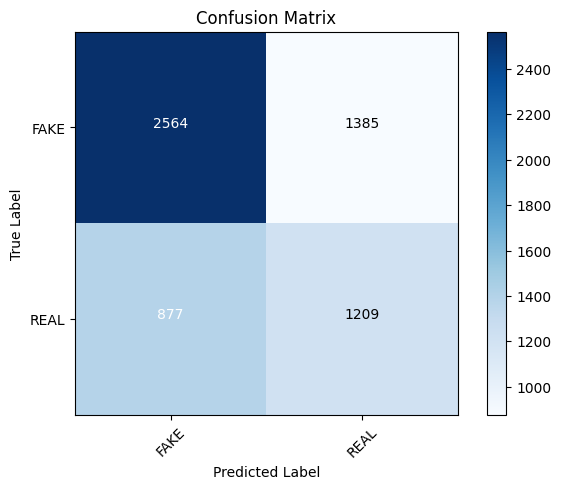

In [ ]:
cm = confusion_matrix(ytest, pred)
plot_confusion_matrix(cm, classes=['FAKE', 'REAL'])

In [ ]:
linear_clf = PassiveAggressiveClassifier(n_iter_no_change=50)

In [ ]:
linear_clf.fit(Xtrain, ytrain)
pred = linear_clf.predict(Xtest)
score = accuracy_score(ytest, pred)
score

0.584092792046396

Confusion Matrix without normalization


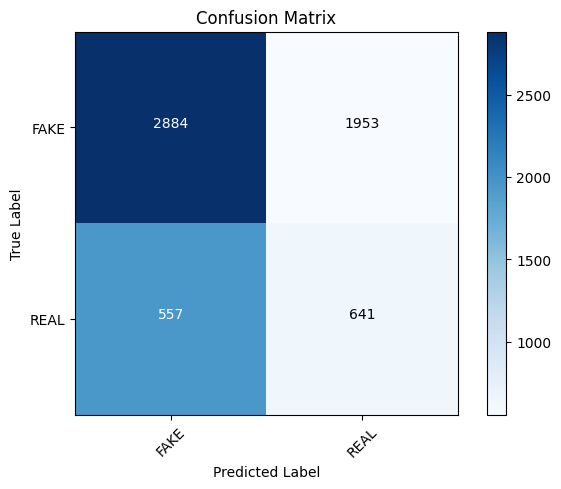

In [ ]:
cm = confusion_matrix(ytest, pred)
plot_confusion_matrix(cm, classes=['FAKE', 'REAL'])

In [ ]:
rmf = RandomForestClassifier(n_estimators=100)
rmf_model = rmf.fit(Xtrain, ytrain)
pred = rmf_model.predict(Xtest)
score = accuracy_score(ytest, pred)
score

0.6806959403479702

Confusion Matrix without normalization


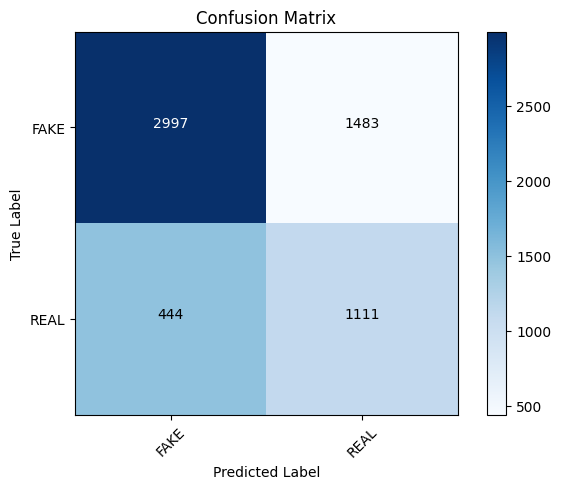

In [ ]:
cm = confusion_matrix(ytest, pred)
plot_confusion_matrix(cm, classes=['FAKE', 'REAL'])

In [ ]:
emb_vec_features = 40
model = Sequential()
model.add(Embedding(voc_size, emb_vec_features, input_length = sent_len))
model.add(LSTM(100))
model.add(Dense(1, activation = 'sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam', metrics =['accuracy'])
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 5000, 40)          2000000   
                                                                 
 lstm (LSTM)                 (None, 100)               56400     
                                                                 
 dense (Dense)               (None, 1)                 101       
                                                                 
Total params: 2056501 (7.84 MB)
Trainable params: 2056501 (7.84 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
model.fit(Xtrain, ytrain, validation_data= (Xtest, ytest), epochs = 10, batch_size=64)

Epoch 1/10
192/192 [==============================] - 72s 338ms/step - loss: 0.3328 - accuracy: 0.8544 - val_loss: 0.2099 - val_accuracy: 0.9210
Epoch 2/10
192/192 [==============================] - 65s 339ms/step - loss: 0.1169 - accuracy: 0.9619 - val_loss: 0.1875 - val_accuracy: 0.9394
Epoch 3/10
192/192 [==============================] - 60s 312ms/step - loss: 0.0539 - accuracy: 0.9829 - val_loss: 0.2076 - val_accuracy: 0.9289
Epoch 4/10
192/192 [==============================] - 56s 289ms/step - loss: 0.0380 - accuracy: 0.9869 - val_loss: 0.2392 - val_accuracy: 0.9254
Epoch 5/10
192/192 [==============================] - 58s 302ms/step - loss: 0.0343 - accuracy: 0.9900 - val_loss: 0.2871 - val_accuracy: 0.9244
Epoch 6/10
192/192 [==============================] - 59s 307ms/step - loss: 0.0280 - accuracy: 0.9921 - val_loss: 0.3214 - val_accuracy: 0.9276
Epoch 7/10
192/192 [==============================] - 56s 289ms/step - loss: 0.0109 - accuracy: 0.9975 - val_loss: 0.3250 - val_ac

In [ ]:
ypred = model.predict(Xtest)

189/189 [==============================] - 11s 58ms/step


In [ ]:
ypred = [1 if i > 0.5 else 0 for i in ypred ]

In [ ]:
accuracy_score(ytest, ypred)

0.8995857497928749

Confusion Matrix without normalization


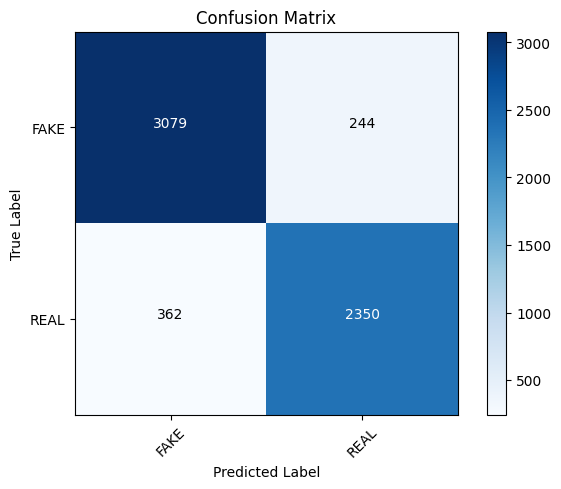

In [ ]:
cm = confusion_matrix(ytest, ypred)
plot_confusion_matrix(cm, classes=['FAKE', 'REAL'])